Set up environment

In [1]:
import os, sys
import pickle
import numpy as np
from scipy import stats
import pandas as pd
import pingouin as pg
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns


from modules.clustering import *
from modules.munging import *
from modules.visualization import *
from modules.autoencoders import *

sns_styleset()

/home/ozvar/Dropbox/PhD/Main/06_Projects/practice_spacing/lol/analysis/venv/lib/python3.8/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.cluster.k_means_ module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.cluster. Anything that cannot be imported from sklearn.cluster is now part of the private API.
  warnings.warn(message, FutureWarning)
/home/ozvar/Dropbox/PhD/Main/06_Projects/practice_spacing/lol/analysis/venv/lib/python3.8/site-packages/tslearn/clustering/kmeans.py:22: UserWarning: Scikit-learn <0.24 will be deprecated in a future release of tslearn
  warnings.warn(


Load data

In [2]:
preprocessed = True
if preprocessed:
    data_path = os.path.join('data', 'df_100_100.csv')
    df = pd.read_csv(data_path)

Set path for figures

In [3]:
fig_dir = os.path.join('figures', 'main')

### Some notes on the data set

- All accounts in the data set are "fresh" for this season
- All recorded games are "ranked" games
- We don't know how many unranked games players have played prior to being recorded in this data set
- We don't know how many unranked games players have played in between ranked games recorded in this data set
- We are agnostic to "smurfs" and multiple players who play on the same account

Here's what the data look like

In [4]:
df.head()

,account_id,region,neutral_creeps,enemy_creeps,time_stamp_end,time_stamp,date,hour,gold,damage_dealt,time_dead,time_played,kills,deaths,assists,rating,position,gpm,gpm_delta,kda,kdr,nth_match,win,time_gap,nth_day
0,110230,EUW1,60.00000,58.00000,1454358371694.00000,1454357029694.00000,2016-02-01,20.00000,12869.00000,30983.00000,71.00000,1342.00000,16.00000,2.00000,8.00000,0.49281,JUNGLE,607.50590,31.34535,12.00000,8.00000,1,True,NaN,1
1,110230,EUW1,26.00000,274.00000,1454361418565.00000,1454358950565.00000,2016-02-01,20.00000,21689.00000,51445.00000,431.00000,2468.00000,25.00000,8.00000,6.00000,0.49897,MIDDLE,638.85125,-64.62256,3.87500,3.12500,2,True,0.16080,1
2,110230,EUW1,19.00000,301.00000,1454434421377.00000,1454431416377.00000,2016-02-02,16.00000,23017.00000,64298.00000,600.00000,3005.00000,17.00000,12.00000,10.00000,0.51211,MIDDLE,574.22869,-131.28217,2.25000,1.41667,3,False,19.44384,2
3,110230,EUW1,21.00000,283.00000,1454518167963.00000,1454516075963.00000,2016-02-03,16.00000,14632.00000,21130.00000,110.00000,2092.00000,4.00000,3.00000,4.00000,0.49651,TOP,442.94652,-23.85416,2.66667,1.33333,4,True,22.68183,3
4,110230,EUW1,0.00000,127.00000,1454520130884.00000,1454518690884.00000,2016-02-03,16.00000,8773.00000,13108.00000,184.00000,1440.00000,9.00000,7.00000,1.00000,0.51129,MIDDLE,419.09236,258.58113,1.42857,1.28571,5,False,0.14526,3


How many players do we have?

In [5]:
n_players = df['account_id'].nunique()
print(f'We have a total of {n_players} players in the data set')
print(f'We have a total of {len(df)} rows in the data set')

We have a total of 162417 players in the data set
We have a total of 16241700 rows in the data set


How long does the average game take?

In [6]:
(df['time_played'] / 60).round(2).describe()

count   16241700.00000
mean          33.29607
std            8.05273
min           15.00000
25%           27.55000
50%           32.72000
75%           38.33000
max          343.53000
Name: time_played, dtype: float64

Specify "training" window

In [7]:
n_matches = 100

How do our DVs trend across the entire sample?

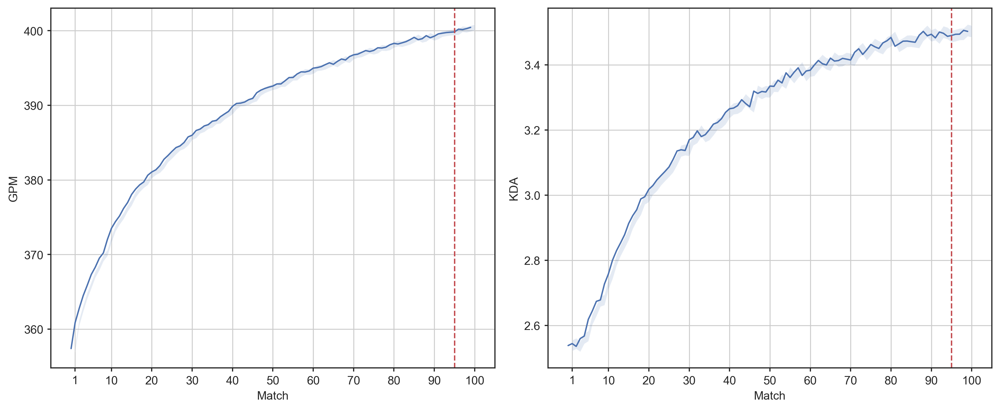

In [8]:
TARGETS = [
    'gpm',
    'kda'
]

target_rmp = {
    'gpm': 'GPM',
    'kda': 'KDA'
}

df['global'] = 1

curves_visualizer(
    df=df,
    grouper='global',
    targets=TARGETS,
    rows=1,
    columns=2,
    n_matches=100,
    fig_size=(12, 5),
    fig_dir=fig_dir,
    fig_name=f'global_gpm_kda_trajectories_{n_matches}_matches',
    grouper_rmp=None,
    target_rmp=target_rmp,
    legend=None)

## Analyse performance of groups of players who space their play differently

-------

Create dataframe for visualization comprising our IV and DV

In [9]:
data = create_summary_dataframe(
    df=df,
    dvs=['gpm', 'kda'],
    n_matches=100,
    head=5,
    tail=5,
    spacing='time_delta',
    verbose=True)

,account_id,spacing,gpm_initial_perf,gpm_acquisition,kda_initial_perf,kda_acquisition
0,110230,46.07930,536.52494,0.96338,4.44405,-0.68571
1,112510,27.02594,500.81889,-38.16694,2.53333,-0.23214
2,116931,31.39937,294.54405,56.32999,1.03397,1.12400
3,132136,78.97467,336.97602,43.92761,1.75397,-0.10167
4,138478,92.06123,368.30855,100.87922,1.04679,9.58957


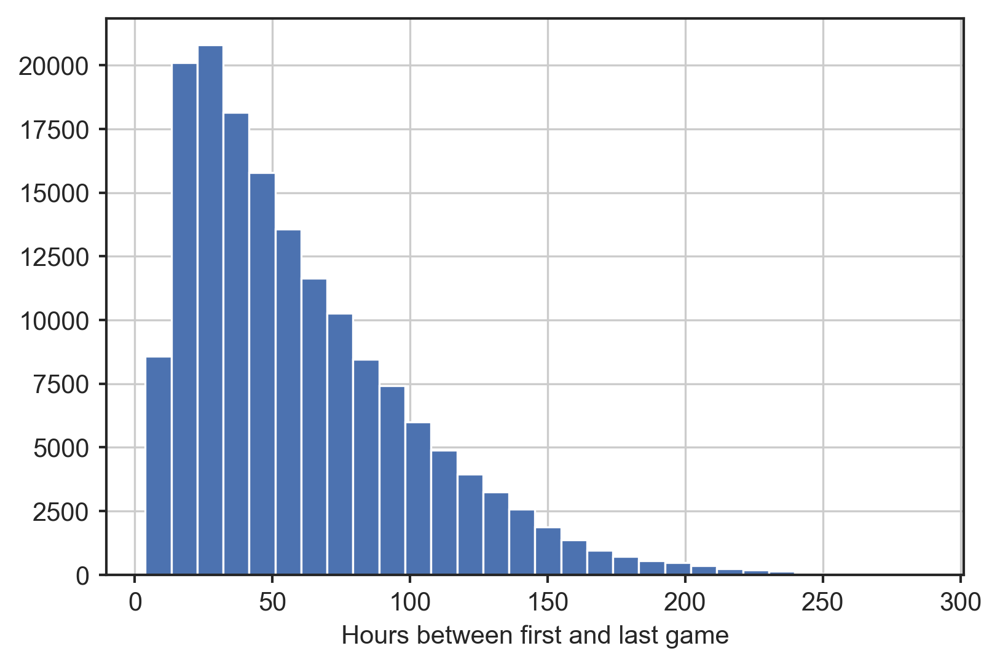

In [10]:
data['spacing'].hist(bins=30)
plt.xlabel('Hours between first and last game')

fig_name = f'histogram_hours_between_first_and_last_game'
plt.savefig(os.path.join(fig_dir, f'{fig_name}.png'))
plt.savefig(os.path.join(fig_dir, f'{fig_name}.tif'), format='tiff')
plt.show()

In [11]:
# declare intervals based on head, middle, and tail of histogram above
intervals = [(1, 15), (76, 90), (136, 150)]
# split summary df and main df into groups based on spacing intervals
groups = [data[(data['spacing'].between(i[0], i[1]))] for i in intervals]
groups_df = [df[df['account_id'].isin(group['account_id'].tolist())] for group in groups]
# get number of players in each group
[group['account_id'].nunique() for group in groups]

[11963, 13120, 3545]

In [12]:
# add spacing group label to df
for group in zip(groups_df, intervals):
    label = f"{group[1][0]} - {group[1][1]} days"
    print(label)
    group[0]['rule_cluster'] = label 
groups_df = pd.concat(groups_df)

1 - 15 days
76 - 90 days
136 - 150 days


/tmp/ipykernel_19351/1952042433.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group[0]['rule_cluster'] = label


Plot performance trajectories with 95% CIs for each group

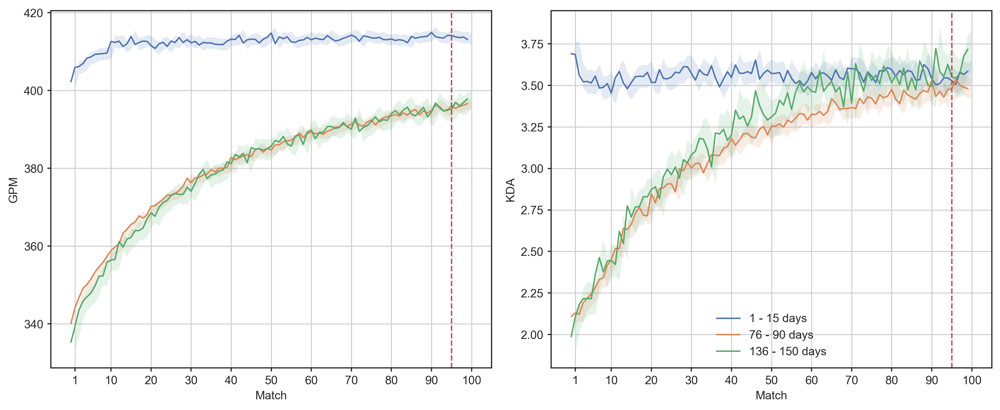

In [13]:
TARGETS = [
    'gpm',
    'kda'
]

target_rmp = {
    'gpm': 'GPM',
    'kda': 'KDA'
}

curves_visualizer(
    df=groups_df,
    grouper='rule_cluster',
    targets=TARGETS,
    rows=1,
    columns=2,
    n_matches=100,
    fig_size=(12, 5),
    fig_dir=fig_dir,
    fig_name=f'spacing_groups_gpm_kda_trajectories_{n_matches}_matches',
    grouper_rmp=None,
    target_rmp=target_rmp,
    legend=True)

### Matching on initial performance

Spacing relates to acquisition but appears strongly confounded by initial ability - we try to control for this here

In [14]:
print(data['gpm_initial_perf'].describe())
print(data['kda_initial_perf'].describe())

count   162417.00000
mean       362.26152
std         63.72333
min        195.16990
25%        315.38942
50%        350.85369
75%        399.88591
max        734.25728
Name: gpm_initial_perf, dtype: float64
count   162417.00000
mean         2.54909
std          1.99814
min          0.06136
25%          1.18331
50%          1.94048
75%          3.26273
max         21.80000
Name: kda_initial_perf, dtype: float64


Subsample players with similar initial performance

In [15]:
gpm_subsample = data[data['gpm_initial_perf'].between(325, 375)]  # median initial_perf +- 25
print(f'There are {len(gpm_subsample)} players in the subsample matched on median initial GPM performance')
kda_subsample = data[data['kda_initial_perf'].between(1.74, 2.13)]  # median initial_perf +- 0.19
print(f'There are {len(kda_subsample)} players in the subsample matched on median initial KDA performance')

There are 52440 players in the subsample matched on median initial GPM performance
There are 17125 players in the subsample matched on median initial KDA performance


In [16]:
# split summary df and main df into groups based on spacing intervals
gpm_groups = [gpm_subsample[(gpm_subsample['spacing'].between(i[0], i[1]))] for i in intervals]
gpm_groups_df = [df[df['account_id'].isin(group['account_id'].tolist())] for group in gpm_groups]
# get number of players in each group
[group['account_id'].nunique() for group in gpm_groups]

[2790, 4510, 1236]

In [17]:
# split summary df and main df into groups based on spacing intervals
kda_groups = [kda_subsample[(kda_subsample['spacing'].between(i[0], i[1]))] for i in intervals]
kda_groups_df = [df[df['account_id'].isin(group['account_id'].tolist())] for group in kda_groups]
# get number of players in each group
[group['account_id'].nunique() for group in kda_groups]

[1159, 1417, 373]

In [18]:
accounts_to_retain={'gpm': pd.concat(gpm_groups_df)['account_id'].unique(),
                    'kda': pd.concat(kda_groups_df)['account_id'].unique()}

Plot performance trajectories with 95% CIs for each group

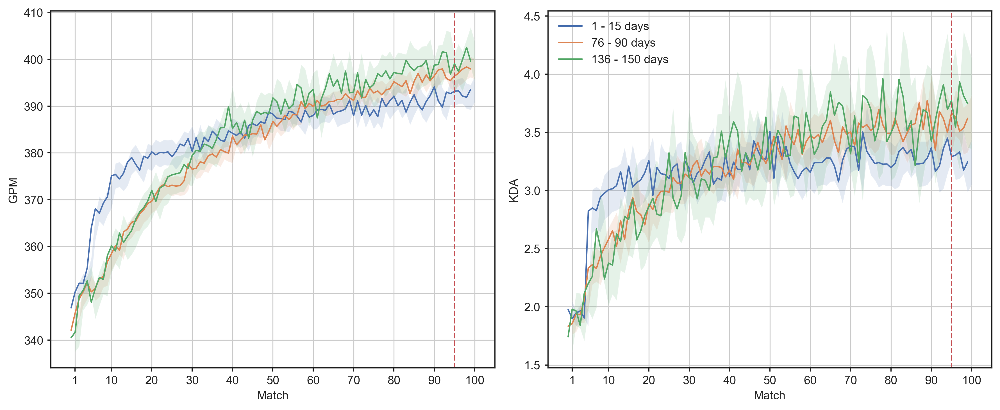

In [19]:
curves_visualizer(
    df=groups_df,
    grouper='rule_cluster',
    targets=TARGETS,
    rows=1,
    columns=2,
    n_matches=100,
    fig_size=(12, 5),
    fig_dir=fig_dir,
    fig_name=f'matched_spacing_groups_gpm_kda_trajectories_{n_matches}_matches',
    grouper_rmp=None,
    target_rmp=target_rmp,
    legend=True,
    accounts_to_retain=accounts_to_retain)

#### Statistical analysis

In [20]:
dv = 'gpm'
x = gpm_groups_df[0].groupby('account_id', sort=False).tail(5)
x = x.groupby('account_id')[dv].mean().tolist()
y = gpm_groups_df[2].groupby('account_id', sort=False).tail(5)
y = y.groupby('account_id')[dv].mean().tolist()

How does GPM differ between groups?

In [21]:
pg.ttest(y, x, correction=False)

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.27531,4024,two-sided,0.00002,"[3.74, 10.07]",0.14608,337.479,0.98968


In [22]:
np.mean(y) - np.mean(x)

6.905586313417132

In [23]:
print('mean = ', np.mean(y), 'std dev = ', np.std(y, ddof=1))

mean =  399.71566187563997 std dev =  49.64979105661167


In [24]:
print('mean = ', np.mean(x), 'std dev = ', np.std(x, ddof=1))

mean =  392.81007556222283 std dev =  46.18056749660115


Same for KDA

In [25]:
dv = 'kda'
x = kda_groups_df[0].groupby('account_id', sort=False).tail(5)
x = x.groupby('account_id')[dv].mean().tolist()
y = kda_groups_df[2].groupby('account_id', sort=False).tail(5)
y = y.groupby('account_id')[dv].mean().tolist()

How does KDA differ between groups?

In [26]:
pg.ttest(y, x, correction=False)

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.45378,1530,two-sided,0.00001,"[0.28, 0.71]",0.26513,1125.065,0.99363


In [27]:
np.mean(y) - np.mean(x)

0.4917204864276634

In [28]:
print('mean = ', np.mean(y), 'std dev = ', np.std(y, ddof=1))

mean =  3.7609719940507467 std dev =  2.175847667745195


In [29]:
print('mean = ', np.mean(x), 'std dev = ', np.std(x, ddof=1))

mean =  3.2692515076230833 std dev =  1.7388890335864515


## What is the relationship between spacing and acquisition across the full range of our variables? 

We regress (gpm) acquisition on spacing, computing robust standard errors due to heteroskedastic residuals

In [30]:
iv = data['spacing']
dv1 = data['gpm_acquisition']

We regress using robust standard errors as residuals look heteroskedastic (see below)

In [31]:
model = sm.OLS(dv1, sm.tools.tools.add_constant(iv))
res = model.fit().get_robustcov_results(cov_type='HC0')
print(res.summary())

                            OLS Regression Results                            
Dep. Variable:        gpm_acquisition   R-squared:                       0.035
Model:                            OLS   Adj. R-squared:                  0.035
Method:                 Least Squares   F-statistic:                     5553.
Date:                Tue, 01 Feb 2022   Prob (F-statistic):               0.00
Time:                        22:31:43   Log-Likelihood:            -9.0042e+05
No. Observations:              162417   AIC:                         1.801e+06
Df Residuals:                  162415   BIC:                         1.801e+06
Df Model:                           1                                         
Covariance Type:                  HC0                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         20.7094      0.275     75.372      0.0

/home/ozvar/Dropbox/PhD/Main/06_Projects/practice_spacing/lol/analysis/venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


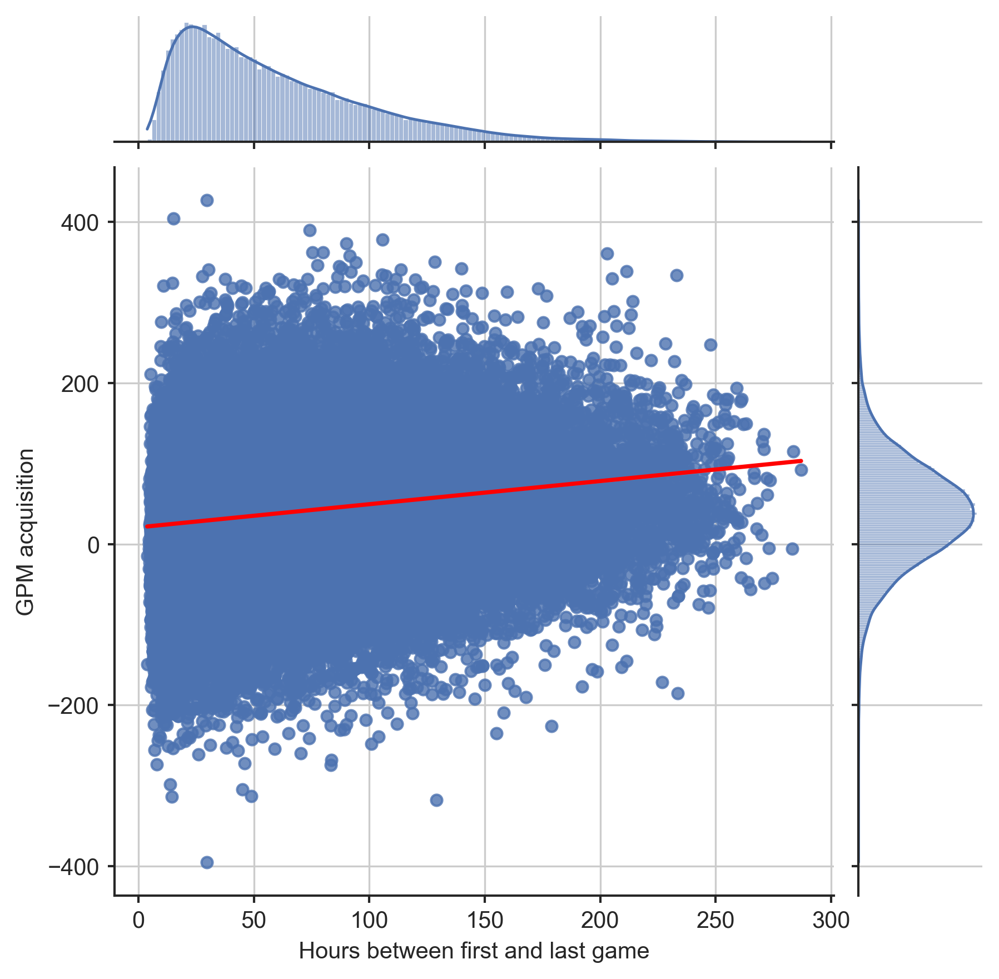

In [32]:
fig = sns.jointplot(iv, dv1, kind='reg', joint_kws={'line_kws':{'color':'red'}})
fig.ax_joint.set_xlabel('Hours between first and last game')
fig.ax_joint.set_ylabel('GPM acquisition')

fig_name = f'regression_spacing_on_gpm_{n_matches}_matches'
plt.savefig(os.path.join(fig_dir, f'{fig_name}.png'))
plt.savefig(os.path.join(fig_dir, f'{fig_name}.tif'), format='tiff')

plt.show()

/home/ozvar/Dropbox/PhD/Main/06_Projects/practice_spacing/lol/analysis/venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


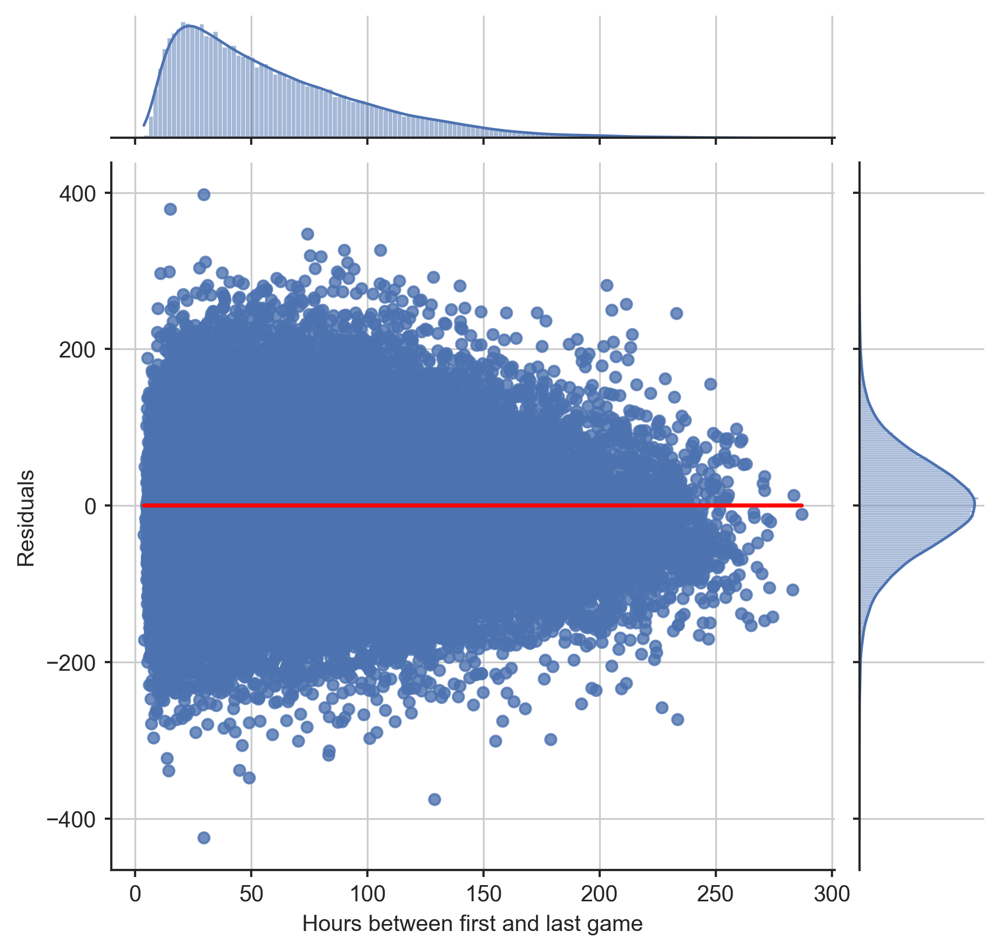

In [33]:
fig = sns.jointplot(iv, res.resid, kind='reg', joint_kws={'line_kws':{'color':'red'}})
fig.ax_joint.set_xlabel('Hours between first and last game')
fig.ax_joint.set_ylabel('Residuals')

fig_name = f'regression_spacing_on_gpm_{n_matches}_matches_residuals'
plt.savefig(os.path.join(fig_dir, f'{fig_name}.png'))
plt.savefig(os.path.join(fig_dir, f'{fig_name}.tif'), format='tiff')

plt.show()

Compute standardised coefficients

In [34]:
std_iv = (iv - iv.mean()) / iv.std()
std_dv = (dv1 - dv1.mean()) / dv1.std()

In [35]:
model = sm.OLS(std_dv, sm.tools.tools.add_constant(std_iv))
res = model.fit().get_robustcov_results(cov_type='HC0')
print(res.summary())

                            OLS Regression Results                            
Dep. Variable:        gpm_acquisition   R-squared:                       0.035
Model:                            OLS   Adj. R-squared:                  0.035
Method:                 Least Squares   F-statistic:                     5553.
Date:                Tue, 01 Feb 2022   Prob (F-statistic):               0.00
Time:                        22:32:28   Log-Likelihood:            -2.2753e+05
No. Observations:              162417   AIC:                         4.551e+05
Df Residuals:                  162415   BIC:                         4.551e+05
Df Model:                           1                                         
Covariance Type:                  HC0                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -5.874e-17      0.002  -2.41e-14      1.0

Repeat for KDA

In [36]:
dv2 = data['kda_acquisition']

In [37]:
model = sm.OLS(dv2, sm.tools.tools.add_constant(iv))
res = model.fit().get_robustcov_results(cov_type='HC0')
print(res.summary())

                            OLS Regression Results                            
Dep. Variable:        kda_acquisition   R-squared:                       0.022
Model:                            OLS   Adj. R-squared:                  0.022
Method:                 Least Squares   F-statistic:                     3495.
Date:                Tue, 01 Feb 2022   Prob (F-statistic):               0.00
Time:                        22:32:28   Log-Likelihood:            -3.7810e+05
No. Observations:              162417   AIC:                         7.562e+05
Df Residuals:                  162415   BIC:                         7.562e+05
Df Model:                           1                                         
Covariance Type:                  HC0                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4060      0.011     35.815      0.0

/home/ozvar/Dropbox/PhD/Main/06_Projects/practice_spacing/lol/analysis/venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


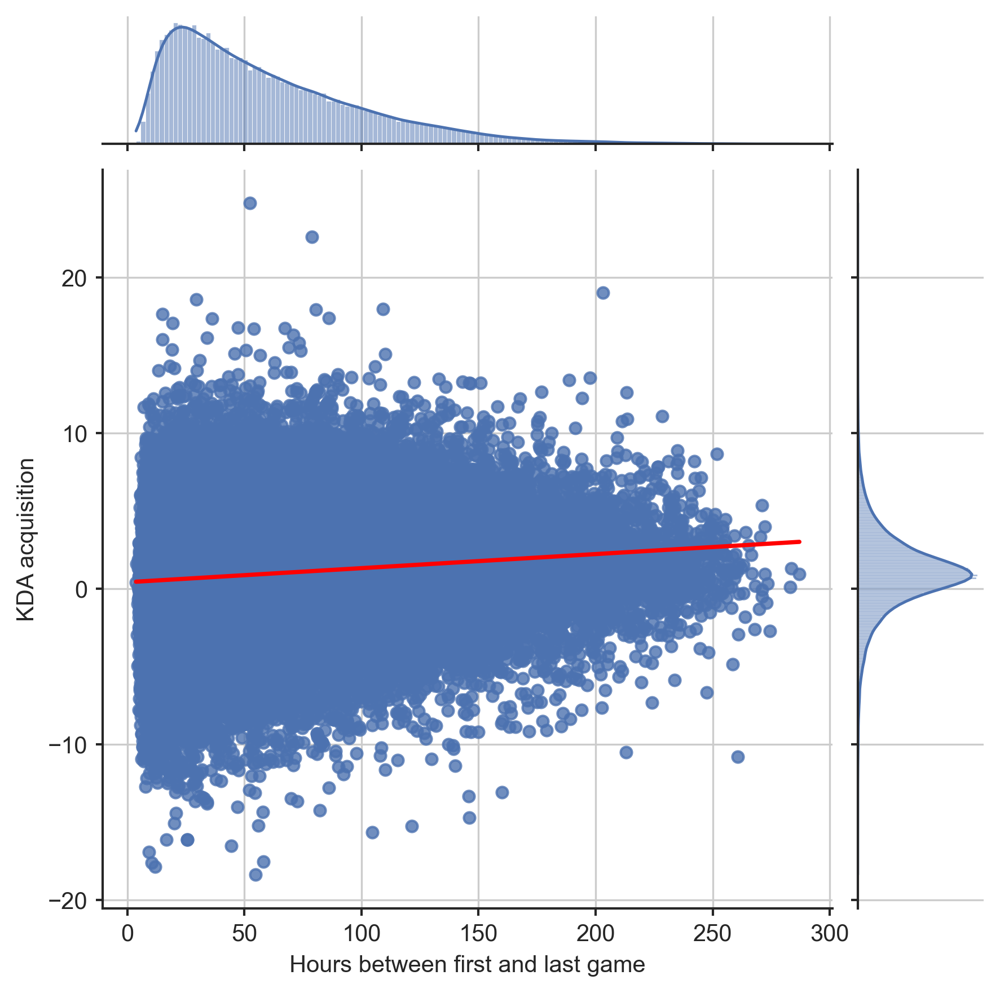

In [38]:
fig = sns.jointplot(iv, dv2, kind='reg', joint_kws={'line_kws':{'color':'red'}})
fig.ax_joint.set_xlabel('Hours between first and last game')
fig.ax_joint.set_ylabel('KDA acquisition')

fig_name = f'regression_spacing_on_kda_{n_matches}_matches'
plt.savefig(os.path.join(fig_dir, f'{fig_name}.png'))
plt.savefig(os.path.join(fig_dir, f'{fig_name}.tif'), format='tiff')

plt.show()

/home/ozvar/Dropbox/PhD/Main/06_Projects/practice_spacing/lol/analysis/venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


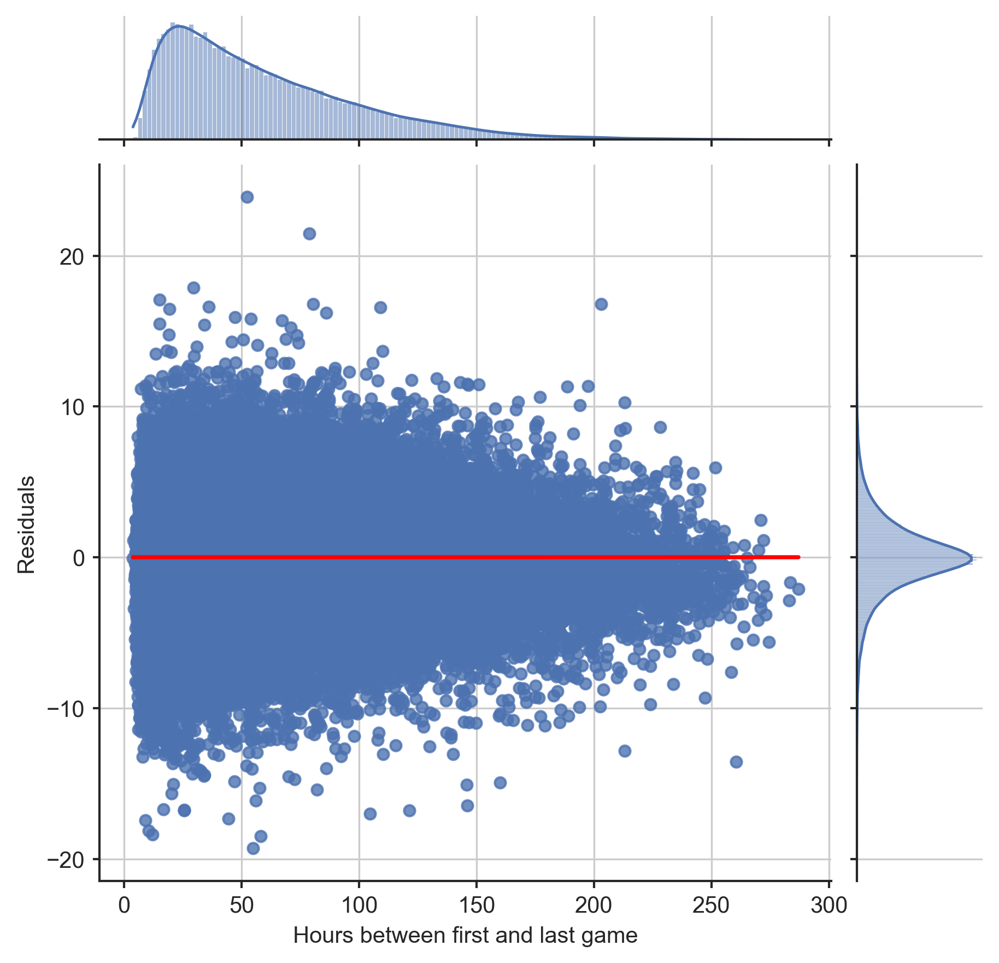

In [39]:
fig = sns.jointplot(iv, res.resid, kind='reg', joint_kws={'line_kws':{'color':'red'}})
fig.ax_joint.set_xlabel('Hours between first and last game')
fig.ax_joint.set_ylabel('Residuals')

fig_name = f'regression_spacing_on_kda_{n_matches}_matches_residuals'
plt.savefig(os.path.join(fig_dir, f'{fig_name}.png'))
plt.savefig(os.path.join(fig_dir, f'{fig_name}.tif'), format='tiff')

plt.show()

Compute standardised coefficients

In [40]:
std_iv = (iv - iv.mean()) / iv.std()
std_dv2 = (dv2 - dv2.mean()) / dv2.std()

In [41]:
model = sm.OLS(std_dv2, sm.tools.tools.add_constant(std_iv))
res = model.fit().get_robustcov_results(cov_type='HC0')
print(res.summary())

                            OLS Regression Results                            
Dep. Variable:        kda_acquisition   R-squared:                       0.022
Model:                            OLS   Adj. R-squared:                  0.022
Method:                 Least Squares   F-statistic:                     3495.
Date:                Tue, 01 Feb 2022   Prob (F-statistic):               0.00
Time:                        22:33:14   Log-Likelihood:            -2.2864e+05
No. Observations:              162417   AIC:                         4.573e+05
Df Residuals:                  162415   BIC:                         4.573e+05
Df Model:                           1                                         
Covariance Type:                  HC0                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.444e-17      0.002   9.96e-15      1.0

Draw joint plot

/home/ozvar/Dropbox/PhD/Main/06_Projects/practice_spacing/lol/analysis/venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/ozvar/Dropbox/PhD/Main/06_Projects/practice_spacing/lol/analysis/venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


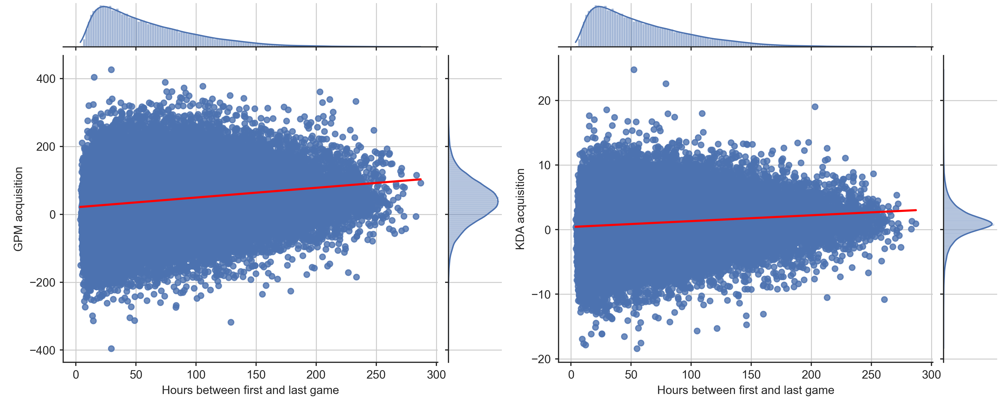

In [42]:
ax1 = sns.jointplot(iv, dv1, kind='reg', joint_kws={'line_kws':{'color':'red'}})
ax2 = sns.jointplot(iv, dv2, kind='reg', joint_kws={'line_kws':{'color':'red'}})

ax1.ax_joint.set_xlabel('Hours between first and last game')
ax1.ax_joint.set_ylabel('GPM acquisition')

ax2.ax_joint.set_xlabel('Hours between first and last game')
ax2.ax_joint.set_ylabel('KDA acquisition')

fig = plt.figure(figsize=(12,5))
gs = gridspec.GridSpec(1, 2)

mg0 = SeabornFig2Grid(ax1, fig, gs[0])
mg1 = SeabornFig2Grid(ax2, fig, gs[1])

gs.tight_layout(fig)

fig_name = f'regression_jointplot_gpm_kda_on_time_delta_between_{n_matches}_matches'
plt.savefig(os.path.join(fig_dir, f'{fig_name}.png'))
plt.savefig(os.path.join(fig_dir, f'{fig_name}.tif'), format='tiff')

plt.show()

### RNN Autoencoder and K-Means

In [43]:
embedding_path = os.path.join('results', 'arrays', 'embedding_feat.npy')
viz_path = os.path.join('results', 'arrays', 'embedding_viz.npy')

if os.path.isfile(embedding_path) and os.path.isfile(viz_path):
    features_embedding = np.load(embedding_path)
    viz_embedding = np.load(viz_path)
else:
    # Save embedding structure
    for n_components, name in zip([2, 20], ['viz', 'feat']):
        file_path = os.path.join('results', 'arrays', f'embedding_{name}')
        embedding = UMAP(
            n_components=n_components,
            n_neighbors=100,
            verbose=True,
            n_epochs=1000,
            metric='euclidean'
        ).fit_transform(X.reshape(X.shape[0], X.shape[1]))

        np.save(file_path, embedding)

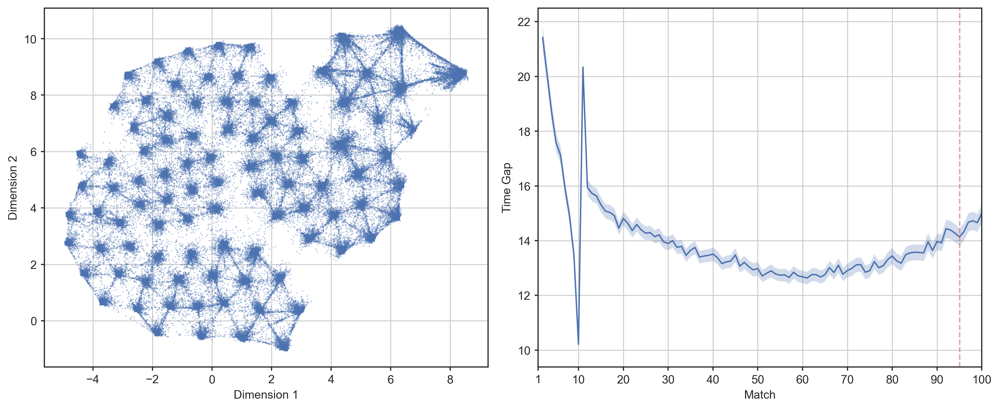

In [44]:
start_gap = 1 # window start distance from first match
end_gap = 5  # window end distance from final match

profiles_visualizer(
    df=df, 
    grouper='global',
    grouper_rmp={'global': 'Global'},
    dim_reduction=viz_embedding, 
    target='time_gap', 
    fig_size=(12, 5),
    fig_dir=fig_dir,
    fig_name=f'UMAP_matches_{start_gap}-{n_matches-end_gap}_time_gap_trajectories_and_clusters',
    target_rmp={'time_gap': 'Time Gap'},
    legend=False
)

In [ ]:
df = df.sort_values(['account_id', 'nth_match'])
unique_ids = len(df['account_id'].unique())
X = df['time_gap'].values
X = X.reshape((unique_ids, 100))
X = X[:, start_gap:-end_gap]
X = tsmv().fit_transform(X)

/home/ozvar/Dropbox/PhD/Main/06_Projects/practice_spacing/lol/analysis/venv/lib/python3.8/site-packages/sklearn/utils/validation.py:931: FutureWarning: Passing attributes to check_is_fitted is deprecated and will be removed in 0.23. The attributes argument is ignored.
  warnings.warn("Passing attributes to check_is_fitted is deprecated"


In [46]:
sequence_autoencoder = RecurrentAutoEncoder(
    X=X, 
    noise=1, 
    units=60, 
    latent_space=30, 
    loss='mae',
    optimizer='adam', 
    output_activation='linear'
)

stopper = EarlyStopping(
    monitor='val_loss',
    patience=15,
    min_delta=0.0001, 
    restore_best_weights=True
)

2022-02-01 22:34:48.290159: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-02-01 22:34:48.378137: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-02-01 22:34:48.378342: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-02-01 22:34:48.379521: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

In [47]:
sequence_autoencoder.fit(
    X, 
    epochs=1000, 
    verbose=1, 
    batch_size=512,
    callbacks=[stopper],
    validation_split=0.2
)

Epoch 1/1000


2022-02-01 22:34:53.302489: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8300


254/254 [==============================] - 14s 41ms/step - loss: 0.4427 - val_loss: 0.4259
Epoch 2/1000
254/254 [==============================] - 10s 38ms/step - loss: 0.4277 - val_loss: 0.4182
Epoch 3/1000
254/254 [==============================] - 9s 37ms/step - loss: 0.4267 - val_loss: 0.4186
Epoch 4/1000
254/254 [==============================] - 9s 37ms/step - loss: 0.4263 - val_loss: 0.4242
Epoch 5/1000
254/254 [==============================] - 9s 37ms/step - loss: 0.4259 - val_loss: 0.4169
Epoch 6/1000
254/254 [==============================] - 9s 37ms/step - loss: 0.4257 - val_loss: 0.4189
Epoch 7/1000
254/254 [==============================] - 9s 37ms/step - loss: 0.4257 - val_loss: 0.4205
Epoch 8/1000
254/254 [==============================] - 9s 37ms/step - loss: 0.4253 - val_loss: 0.4143
Epoch 9/1000
254/254 [==============================] - 9s 37ms/step - loss: 0.4251 - val_loss: 0.4180
Epoch 10/1000
254/254 [==============================] - 9s 37ms/step - loss: 0.4250

In [48]:
embedding_feature = sequence_autoencoder.encode(X)

Clustering 2
Clustering 3
Clustering 4
Clustering 5
Clustering 6
Clustering 7
Clustering 8
Clustering 9
Clustering 10
Optimal k found at 4


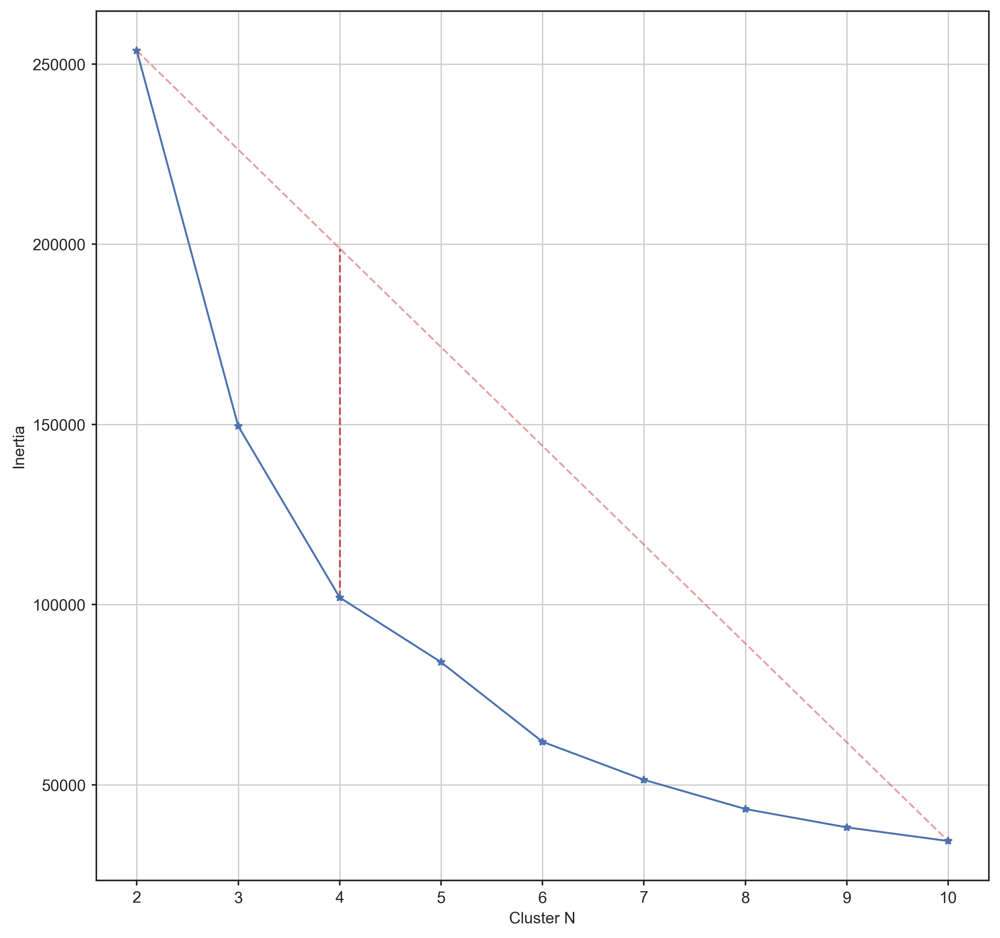

In [49]:
rnn_clust = auto_k_means(
    embedding_feature, 
    min_k=2, 
    max_k=11, 
    fig_dir=os.path.join('figures', 'main'), 
    max_iter=3000,
    n_init=2000,
    n_matches=100,
    start_gap=1,
    end_gap=5
)
df['rnn_clusters'] = df['account_id'].map(
    {acc_id: label for acc_id, label in zip(df['account_id'].unique(), rnn_clust.labels_)}
)

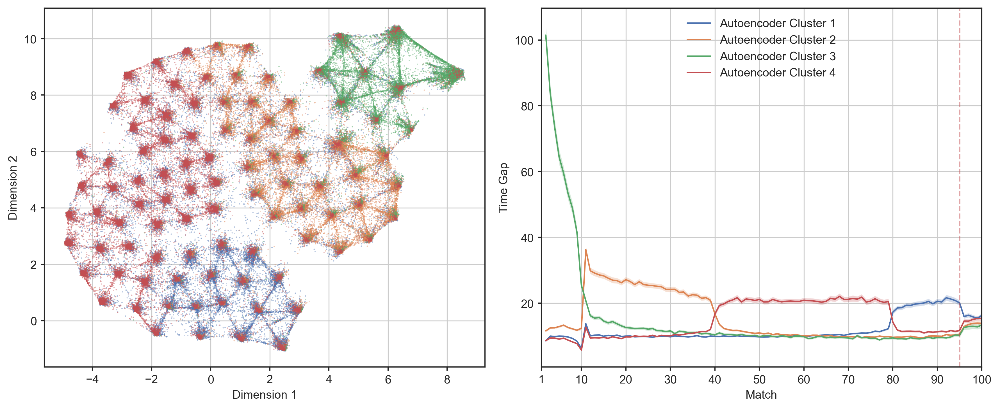

In [50]:
profiles_visualizer(
    df=df, 
    grouper='rnn_clusters',
    grouper_rmp={'rnn_clusters': 'Autoencoder Cluster'},
    dim_reduction=viz_embedding, 
    target='time_gap', 
    fig_size=(12, 5),
    fig_dir=fig_dir,
    fig_name=f'RNN_clusters_matches_{start_gap}-{100-end_gap}_time_gap_trajectories_and_clusters',
    target_rmp={'time_gap': 'Time Gap'},
    legend=True
)

Plot trajectories of dvs for each Cluster

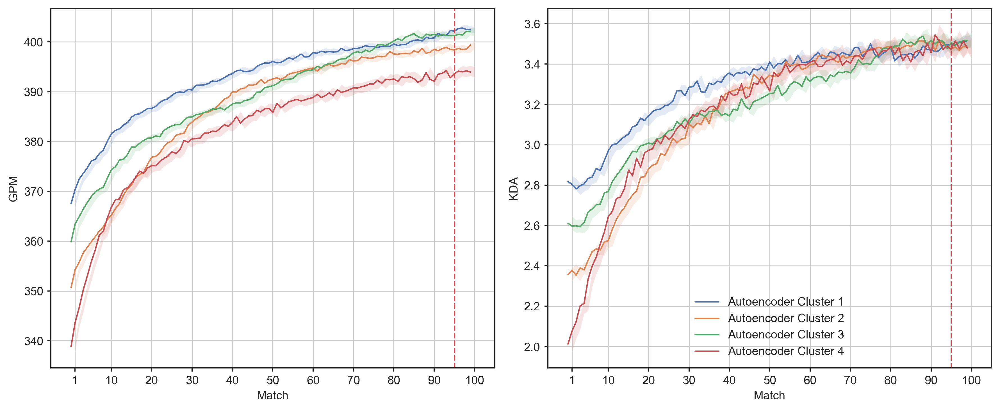

In [51]:
curves_visualizer(
    df=df,
    grouper='rnn_clusters', 
    targets=TARGETS,
    rows=1,
    columns=2,
    n_matches=100,
    fig_size=(12, 5),
    fig_dir=fig_dir,
    fig_name=f'autoencoder_clusters_gpm_kda_trajectories_{n_matches}_matches',
    target_rmp=target_rmp,
    grouper_rmp={'rnn_clusters': 'Autoencoder Cluster'},
    accounts_to_retain=None #add dictionary of accounts to retain if you want to filter out the others
)

Repeat after matching on initial performance

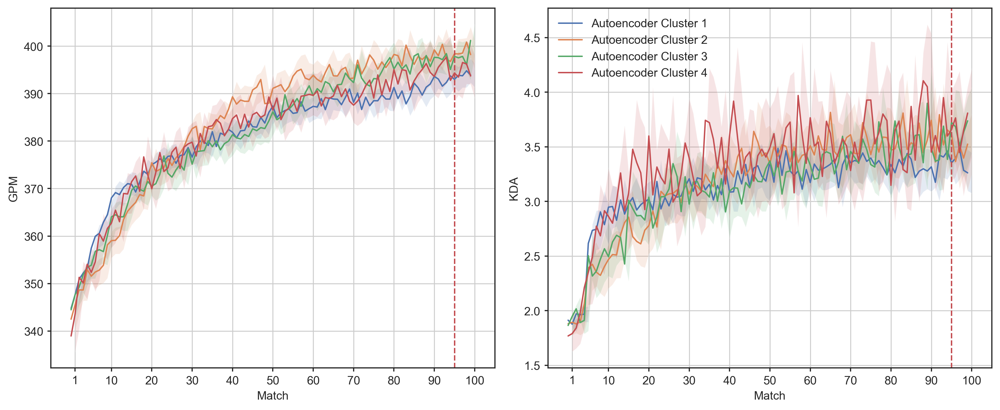

In [52]:
curves_visualizer(
    df=df,
    grouper='rnn_clusters', 
    targets=TARGETS,
    rows=1,
    columns=2,
    n_matches=100,
    fig_size=(12, 5),
    fig_dir=fig_dir,
    fig_name=f'matched_autoencoder_clusters_gpm_kda_trajectories_{n_matches}_matches',
    target_rmp=target_rmp,
    grouper_rmp={'rnn_clusters': 'Autoencoder Cluster'},
    accounts_to_retain=accounts_to_retain #add dictionary of accounts to retain if you want to filter out the others
)

In [53]:
data = data.sort_values(by='account_id')
data['rnn_clusters'] = df.groupby('account_id')['rnn_clusters'].first().values

In [54]:
pg.anova(data, 'gpm_acquisition', 'rnn_clusters')

,Source,ddof1,ddof2,F,p-unc,np2
0,rnn_clusters,3,162413,517.92733,0.00000,0.00948


In [55]:
pg.anova(data, 'kda_acquisition', 'rnn_clusters')

,Source,ddof1,ddof2,F,p-unc,np2
0,rnn_clusters,3,162413,439.87280,0.00000,0.00806


How does GPM differ between groups?

In [56]:
dv = 'gpm_acquisition'
n_clusters = data['rnn_clusters'].nunique()
tests = []
pvals = []
pairs = []
for i in range(n_clusters):
    for j in range(i+1, n_clusters):
        
        print(f'---\nComparing clusters {i+1} and {j+1}')
        x = data[data['rnn_clusters'] == i].groupby('account_id', sort=False).tail(5)
        x = x[x['account_id'].isin(gpm_subsample['account_id'].values)]
        x = x.groupby('account_id')[dv].mean().tolist()
        y = data[data['rnn_clusters'] == j].groupby('account_id', sort=False).tail(5)
        y = y[y['account_id'].isin(gpm_subsample['account_id'].values)]
        y = y.groupby('account_id')[dv].mean().tolist()
        # run the test
        test = pg.ttest(y, x, correction=False)
        p = test['p-val'].values[0]
        tests.append(test)
        pvals.append(p)
        pairs.append((i+1, j+1))

print('---\nHolm-Bonferroni corrected p-values of pairwise comparisons:')
pvals = pg.multicomp(pvals)[1]
print(pvals)

print('---\nPairs of groups that differ significantly:')
for i, p in enumerate(pvals):
    if p < 0.05:
        print(f'---\nClusters {pairs[i][0]} and {pairs[i][1]}\n---')
        print(tests[i])

---
Comparing clusters 1 and 2
---
Comparing clusters 1 and 3
---
Comparing clusters 1 and 4
---
Comparing clusters 2 and 3
---
Comparing clusters 2 and 4
---
Comparing clusters 3 and 4
---
Holm-Bonferroni corrected p-values of pairwise comparisons:
[3.11439524e-07 1.06471115e-03 1.17646525e-04 9.21283125e-01
 9.21283125e-01 9.21283125e-01]
---
Pairs of groups that differ significantly:
---
Clusters 1 and 2
---
             T    dof alternative   p-val        CI95%  cohen-d       BF10  \
T-test 5.44596  31839   two-sided 0.00000  [1.9, 4.03]  0.06136  3.455e+04   

         power  
T-test 0.99975  
---
Clusters 1 and 3
---
             T    dof alternative   p-val         CI95%  cohen-d    BF10  \
T-test 3.64670  24758   two-sided 0.00027  [1.13, 3.76]  0.05098  12.097   

         power  
T-test 0.95416  
---
Clusters 1 and 4
---
             T    dof alternative   p-val         CI95%  cohen-d    BF10  \
T-test 4.22911  30911   two-sided 0.00002  [1.27, 3.46]  0.04855  98.414   

    

How does KDA differ between groups?

In [57]:
dv = 'kda_acquisition'
n_clusters = data['rnn_clusters'].nunique()
tests = []
pvals = []
pairs = []
for i in range(n_clusters):
    for j in range(i+1, n_clusters):
        
        print(f'---\nComparing clusters {i+1} and {j+1}')
        x = data[data['rnn_clusters'] == i].groupby('account_id', sort=False).tail(5)
        x = x[x['account_id'].isin(kda_subsample['account_id'].values)]
        x = x.groupby('account_id')[dv].mean().tolist()
        y = data[data['rnn_clusters'] == j].groupby('account_id', sort=False).tail(5)
        y = y[y['account_id'].isin(kda_subsample['account_id'].values)]
        y = y.groupby('account_id')[dv].mean().tolist()
        # run the test
        test = pg.ttest(y, x, correction=False)
        p = test['p-val'].values[0]
        tests.append(test)
        pvals.append(p)
        pairs.append((i+1, j+1))

print('---\nHolm-Bonferroni corrected p-values of pairwise comparisons:')
pvals = pg.multicomp(pvals)[1]
print(pvals)

print('---\nPairs of groups that differ significantly:')
for i, p in enumerate(pvals):
    if p < 0.05:
        print(f'---\nClusters {pairs[i][0]} and {pairs[i][1]}\n---')
        print(tests[i])

---
Comparing clusters 1 and 2
---
Comparing clusters 1 and 3
---
Comparing clusters 1 and 4
---
Comparing clusters 2 and 3
---
Comparing clusters 2 and 4
---
Comparing clusters 3 and 4
---
Holm-Bonferroni corrected p-values of pairwise comparisons:
[0.12516461 0.01378013 0.19512944 0.49663492 0.81876243 0.49663492]
---
Pairs of groups that differ significantly:
---
Clusters 1 and 3
---
             T   dof alternative   p-val         CI95%  cohen-d   BF10   power
T-test 3.04987  8195   two-sided 0.00230  [0.05, 0.23]  0.07521  2.871 0.86205


## Cluster Overlaps

Redo labelling of rule clusters following addition of rnn_clusters

In [58]:
groups_df = [df[df['account_id'].isin(group['account_id'].tolist())] for group in groups]
# get number of players in each group
[group['account_id'].nunique() for group in groups]
# add spacing group label to df
for group in zip(groups_df, intervals):
    label = f"{group[1][0]} - {group[1][1]} days"
    print(label)
    group[0]['rule_cluster'] = label 
groups_df = pd.concat(groups_df)

1 - 15 days
76 - 90 days
136 - 150 days


/tmp/ipykernel_19351/1164050826.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group[0]['rule_cluster'] = label


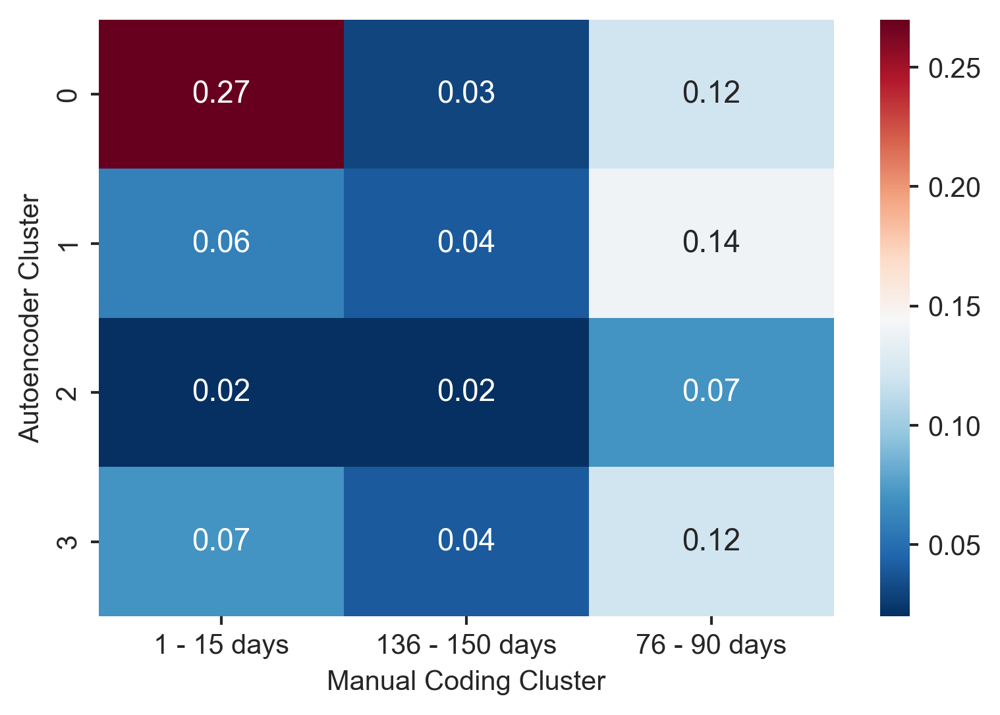

In [59]:
visualize_cluster_overlap(
    groups_df[(groups_df['rnn_clusters'] != -1) & (groups_df['rule_cluster'] != -1)], 
    'rnn_clusters', 
    'rule_cluster',
    groups_rmp={
        'rnn_clusters': 'Autoencoder Cluster',
        'rule_cluster': 'Manual Coding Cluster'
    }
)